In [ ]:
##cleaning memory
# import gc
# gc.collect()

43

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.callbacks import TensorBoard

In [ ]:

# Temporal correction (May 22, 2022)
# TensorFlow datasets had an error when downloading the dogs and cats dataset, which was fixed on May 16th, but it still fails in Colabs. So this additional line is added.
# More details here: https://github.com/tensorflow/datasets/issues/3918
# setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")

#Download dataset
dataset, info = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)


# Preprocessing and visualization

In [ ]:
#Print metadatos
info

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir='/root/tensorflow_datasets/cats_vs_dogs/4.0.1',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, 

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

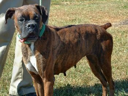
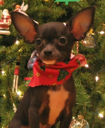
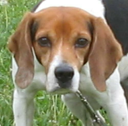
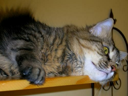
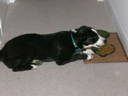

In [ ]:
#One way to show examples
tfds.as_dataframe(dataset['train'].take(5), info)

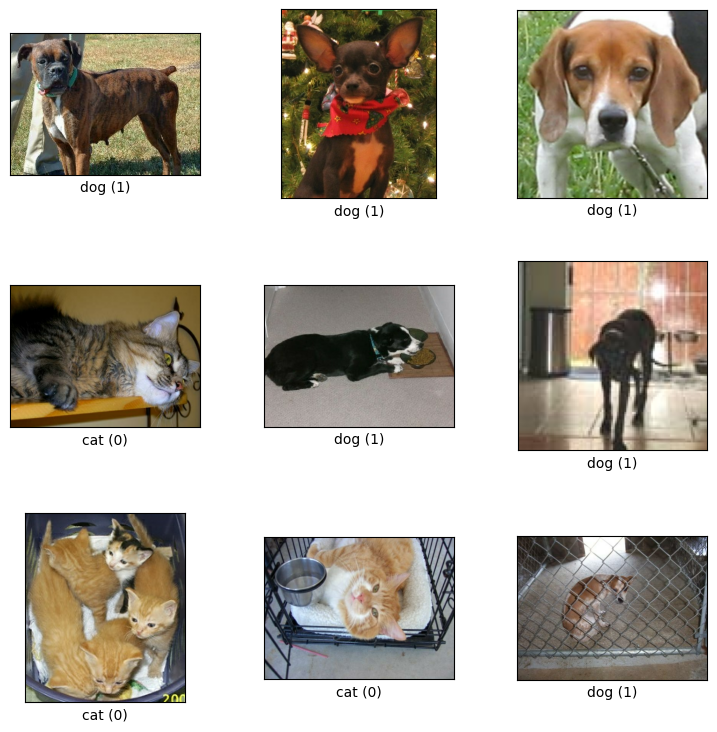

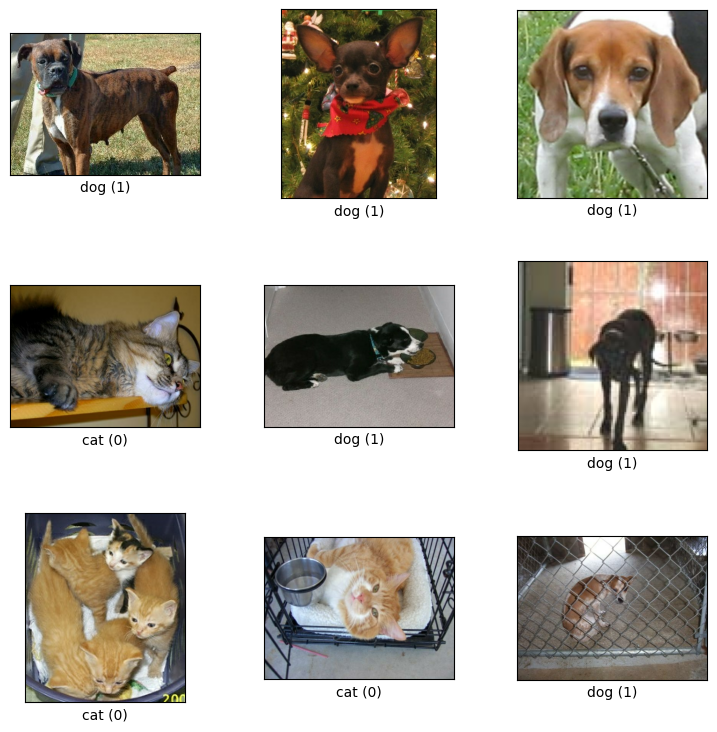

In [ ]:
#Another way
tfds.show_examples(dataset['train'], info)

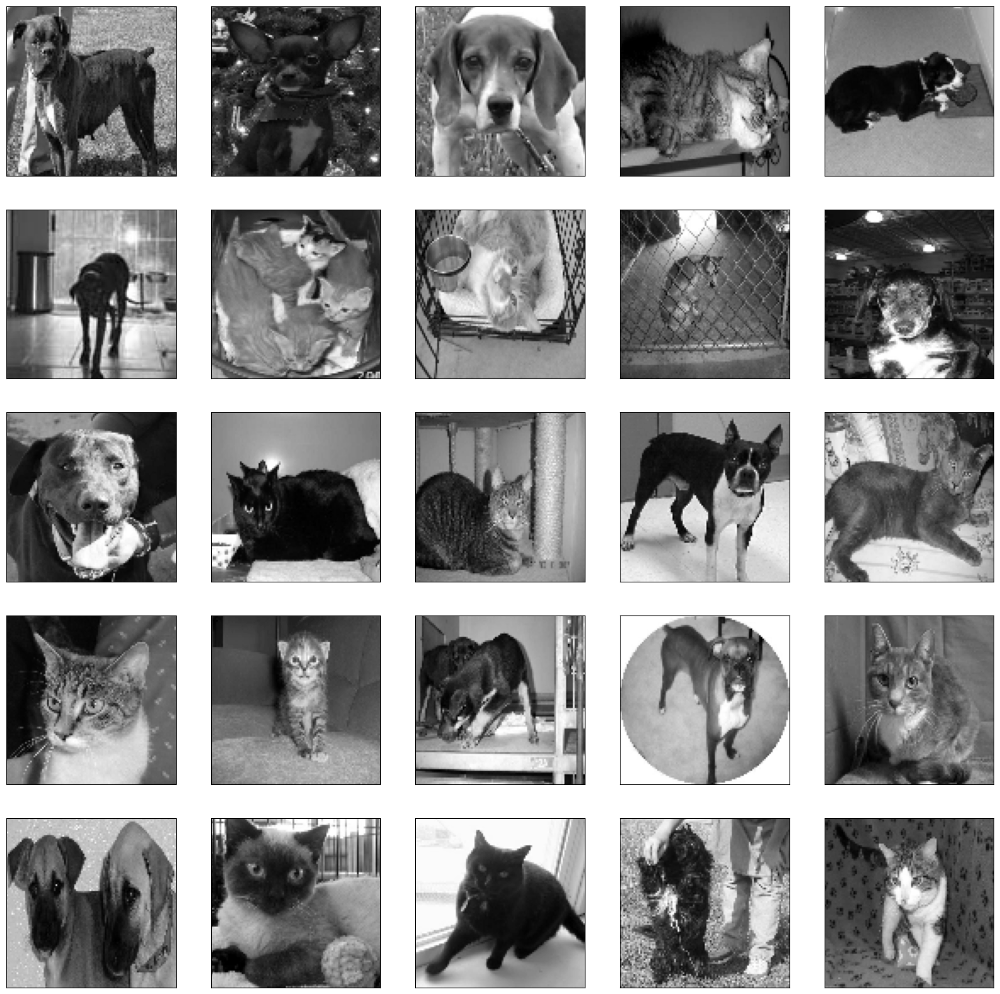

In [ ]:

#Manipulating and visualizing the dataset
#We resize it to SIZE_IMG (100x100) and convert it to grayscale (just for visualization)
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(dataset['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')

In [ ]:
#Variable que contendra todos los pares de los datos (imagen y etiqueta) ya modificados (blanco y negro, 100x100)
train = []

In [ ]:
for i, (imagen, etiqueta) in enumerate(dataset['train']): #Todos los datos
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1) #Cambiar tamano a 100,100,1
  train.append([imagen, etiqueta])

In [ ]:
#Ver los datos del primer indice
train[4]

[array([[[139],
         [141],
         [147],
         ...,
         [175],
         [177],
         [182]],
 
        [[135],
         [139],
         [145],
         ...,
         [175],
         [177],
         [182]],
 
        [[132],
         [131],
         [136],
         ...,
         [175],
         [177],
         [182]],
 
        ...,
 
        [[164],
         [154],
         [166],
         ...,
         [166],
         [163],
         [158]],
 
        [[165],
         [168],
         [163],
         ...,
         [160],
         [164],
         [160]],
 
        [[166],
         [165],
         [166],
         ...,
         [157],
         [159],
         [156]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [ ]:
#Ver cuantos datos tengo en la variable
len(train)

23262

In [ ]:
#Preparing my variables X (inputs) and y (labels) separately

X = [] #input (pixels)
y = [] #labels

for imagen, etiqueta in train:
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
#Normalizing the data of X (images). They are converted to floating point numbers and divided by 255 to range from 0-1 instead of 0-255
import numpy as np

X = np.array(X).astype(float) / 255

In [ ]:
#Convert labels to a simple array
y = np.array(y)

# Creating models

In [ ]:
#Three different models:

modeloDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
#Compile models
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

# Train model n1: Dense

In [ ]:
tensorboardDenso = TensorBoard(log_dir='logs/denso')


history = modeloDenso.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 [==============================] - 5s 5ms/step - loss: 0.7232 - accuracy: 0.5512 - val_loss: 0.6731 - val_accuracy: 0.5705
Epoch 2/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6722 - accuracy: 0.5878 - val_loss: 0.6599 - val_accuracy: 0.6046
Epoch 3/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6665 - accuracy: 0.5926 - val_loss: 0.6647 - val_accuracy: 0.5994
Epoch 4/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6625 - accuracy: 0.6040 - val_loss: 0.6639 - val_accuracy: 0.6014
Epoch 5/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6616 - accuracy: 0.5990 - val_loss: 0.6633 - val_accuracy: 0.6089
Epoch 6/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6589 - accuracy: 0.6063 - val_loss: 0.6616 - val_accuracy: 0.6097
Epoch 7/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6546 - accuracy: 0.6124 - val_loss: 0.6825 - val_accuracy: 0.5888

# Tensorboard

In [ ]:
#Load the TensorBoard extension in Colab
%load_ext tensorboard

In [ ]:
#Run TensorBoard and specify to read the "logs" folder
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Train model n2: CNN

In [ ]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')

history = modeloCNN.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 [==============================] - 11s 14ms/step - loss: 0.6064 - accuracy: 0.6565 - val_loss: 0.5407 - val_accuracy: 0.7287
Epoch 2/100
618/618 [==============================] - 7s 11ms/step - loss: 0.4677 - accuracy: 0.7755 - val_loss: 0.4260 - val_accuracy: 0.8086
Epoch 3/100
618/618 [==============================] - 7s 12ms/step - loss: 0.3878 - accuracy: 0.8225 - val_loss: 0.4146 - val_accuracy: 0.8054
Epoch 4/100
618/618 [==============================] - 7s 12ms/step - loss: 0.3305 - accuracy: 0.8517 - val_loss: 0.3891 - val_accuracy: 0.8232
Epoch 5/100
618/618 [==============================] - 7s 12ms/step - loss: 0.2743 - accuracy: 0.8834 - val_loss: 0.3915 - val_accuracy: 0.8335
Epoch 6/100
618/618 [==============================] - 7s 12ms/step - loss: 0.2084 - accuracy: 0.9145 - val_loss: 0.4001 - val_accuracy: 0.8355
Epoch 7/100
618/618 [==============================] - 7s 11ms/step - loss: 0.1496 - accuracy: 0.9408 - val_loss: 0.5082 - val_accuracy

# Train model n3: CNN 2

In [ ]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 [==============================] - 12s 16ms/step - loss: 0.6605 - accuracy: 0.5931 - val_loss: 0.5958 - val_accuracy: 0.6771
Epoch 2/100
618/618 [==============================] - 9s 15ms/step - loss: 0.5502 - accuracy: 0.7145 - val_loss: 0.5166 - val_accuracy: 0.7496
Epoch 3/100
618/618 [==============================] - 9s 15ms/step - loss: 0.4774 - accuracy: 0.7693 - val_loss: 0.4593 - val_accuracy: 0.7811
Epoch 4/100
618/618 [==============================] - 9s 15ms/step - loss: 0.4313 - accuracy: 0.7963 - val_loss: 0.4080 - val_accuracy: 0.8112
Epoch 5/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3852 - accuracy: 0.8272 - val_loss: 0.3800 - val_accuracy: 0.8318
Epoch 6/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3427 - accuracy: 0.8490 - val_loss: 0.3674 - val_accuracy: 0.8390
Epoch 7/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3013 - accuracy: 0.8708 - val_loss: 0.3695 - val_accuracy

# Training the model with data augmentation

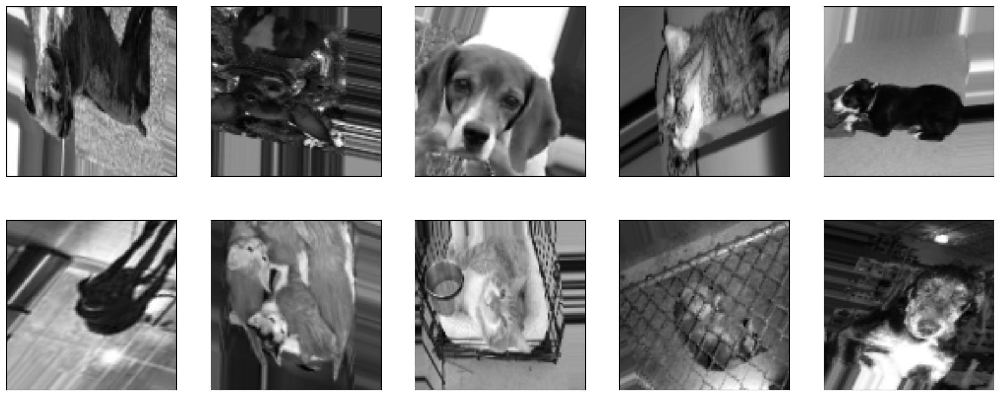

In [ ]:
#Perform data augmentation with various transformations. Finally, plot 10 as an example.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break

In [ ]:
modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
#Separate the training data and the test data into different variables

len(X) * .85 #19700
len(X) - 19700 #3562

X_entrenamiento = X[:19700]
X_validacion = X[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [ ]:
#Use the `flow` function of the generator to create an iterator that we can pass as training data to the `fit` function of the model
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

Training the model with data augmentation

In [ ]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

Epoch 1/100
616/616 [==============================] - 27s 42ms/step - loss: 0.6830 - accuracy: 0.5587 - val_loss: 0.6622 - val_accuracy: 0.6112
Epoch 2/100
616/616 [==============================] - 26s 41ms/step - loss: 0.6681 - accuracy: 0.5950 - val_loss: 0.6869 - val_accuracy: 0.5716
Epoch 3/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6537 - accuracy: 0.6180 - val_loss: 0.6557 - val_accuracy: 0.6101
Epoch 4/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6412 - accuracy: 0.6339 - val_loss: 0.6083 - val_accuracy: 0.6766
Epoch 5/100
616/616 [==============================] - 24s 39ms/step - loss: 0.6270 - accuracy: 0.6530 - val_loss: 0.5901 - val_accuracy: 0.7027
Epoch 6/100
616/616 [==============================] - 24s 40ms/step - loss: 0.6195 - accuracy: 0.6589 - val_loss: 0.5557 - val_accuracy: 0.7165
Epoch 7/100
616/616 [==============================] - 24s 40ms/step - loss: 0.6066 - accuracy: 0.6706 - val_loss: 0.5692 - val_ac